In [1]:

import sys, os
from pathlib import Path
import matplotlib.pyplot as plt
from report import NOTEBOOK_ARGS_PATH
from datetime import datetime
from IPython.display import Markdown as md
plt.rc("axes", titlesize=15, labelsize="x-large")


parent = Path(os.path.abspath('')).parent.__str__()
if parent not in sys.path: sys.path.append(parent)


from Utils.plotter import Plotter
from Utils.dataprocessor import DataProcessor, DataType
from Utils.calibration import Calibration


with open(NOTEBOOK_ARGS_PATH, 'r') as args:
    panelpath, reportname = args.read().split()

Plotter.set_plotter_mode("report")

In [2]:
%%capture
first_run_frame, first_calibration_frame, second_grid_frame, second_run_frame, second_calibration_frame, fov_frame, error_frame = \
DataProcessor.load_to_report(  DataType.FIRST_RUN_DATA,DataType.FIRST_CALIBRATION_DATA,
                               DataType.SECOND_GRID_DATA,DataType.SECOND_RUN_DATA,
                               DataType.SECOND_CALIBRATION_DATA,DataType.FOV_DATA, DataType.ERROR_DATA, path=panelpath)


x_grid_size, y_grid_size = second_calibration_frame["x_light"].drop_duplicates().shape[0], second_calibration_frame["y_light"].drop_duplicates().shape[0]
fov = None
if not fov_frame.empty:
    fov = Calibration.estimate_fov(fov_frame)


# Panel report

In [3]:
datestring = f"<h2 style='font-size:25px'> Calibration date: {datetime.now().strftime('%B %d %Y, %H:%M')}</h2>"
panelstring = f"<h2 style='font-size:25px'> Panel number: {reportname}</h2>"
fovstring = f"<h2 style='font-size:25px'> Approximate estimated fov: {fov} degrees</h2>"
gridsizestring = f"<h2 style='font-size:25px'> Grid size: {x_grid_size}x{y_grid_size}</h2>"
md(("\n").join([datestring,panelstring,fovstring,gridsizestring]))

<h2 style='font-size:25px'> Calibration date: June 02 2024, 17:18</h2>
<h2 style='font-size:25px'> Panel number: g01-0002</h2>
<h2 style='font-size:25px'> Approximate estimated fov: 47.4855 degrees</h2>
<h2 style='font-size:25px'> Grid size: 14x14</h2>

# Initial tests

## Sensor field of view preliminary estimation

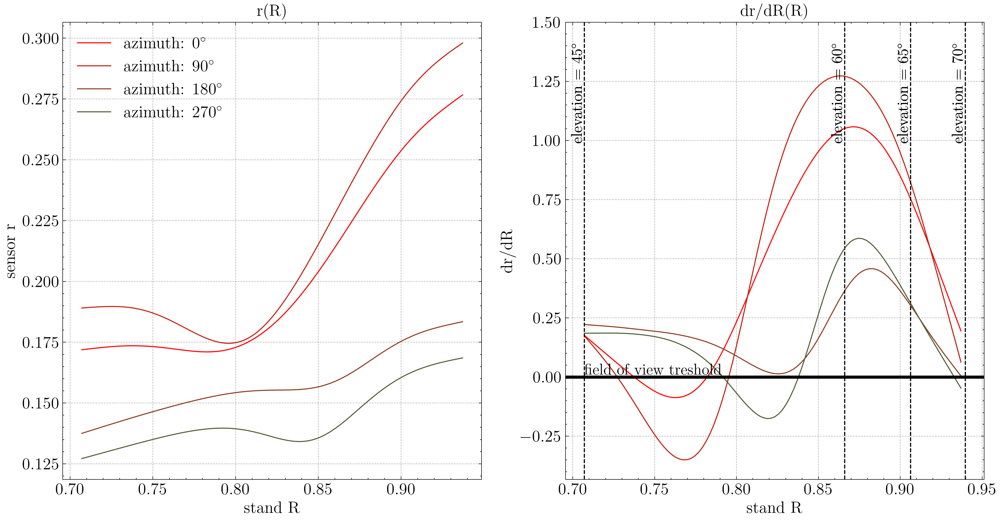

In [4]:
if not fov_frame.empty: 
    Plotter.plot_fov_preestimation(fov_frame)

## First passage

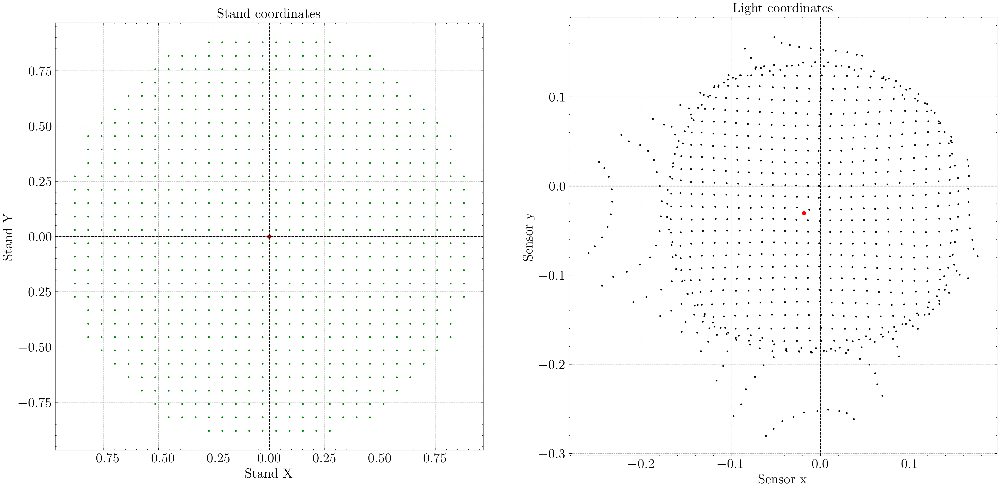

In [5]:

Plotter.plot_first_grid_measurements(first_run_frame)

## First interpolation result

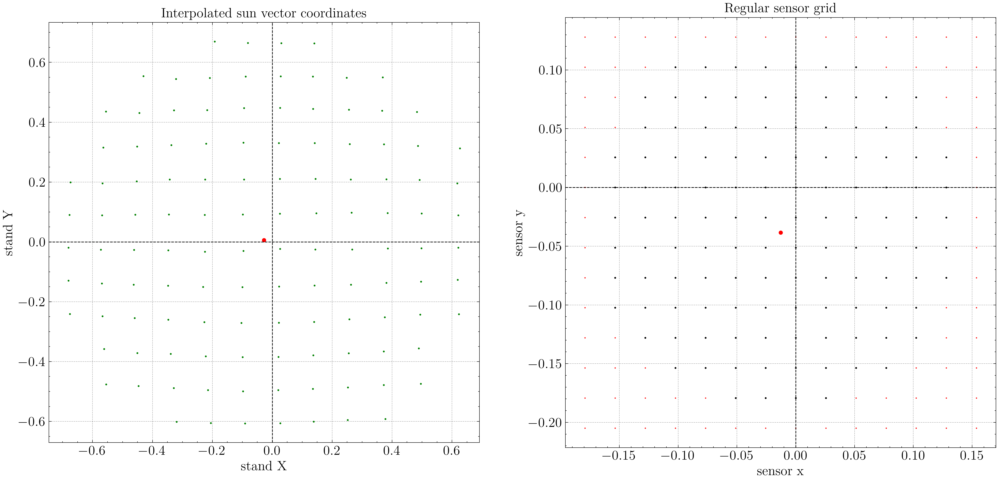

In [6]:
Plotter.plot_interpolation_results(first_calibration_frame)

##  Adc channels light distribution in percents

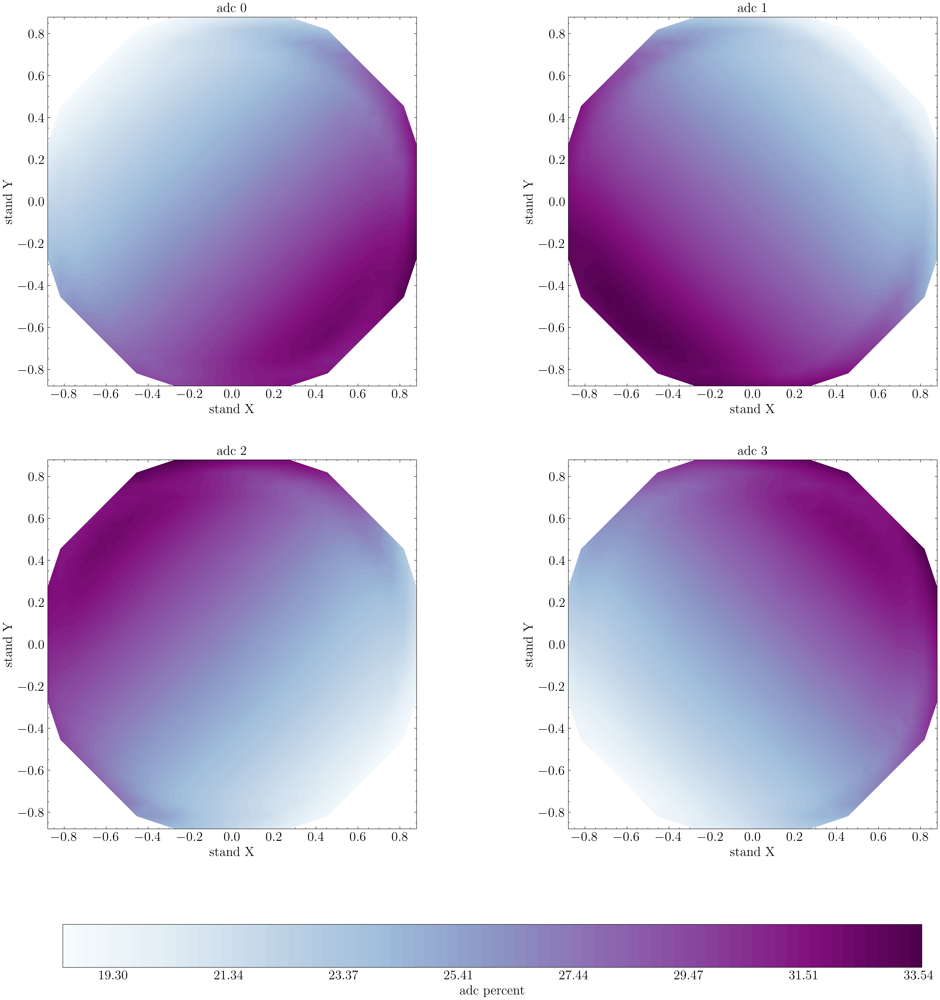

In [7]:
Plotter.plot_adc_chanels(first_run_frame)

## Sensor FOV

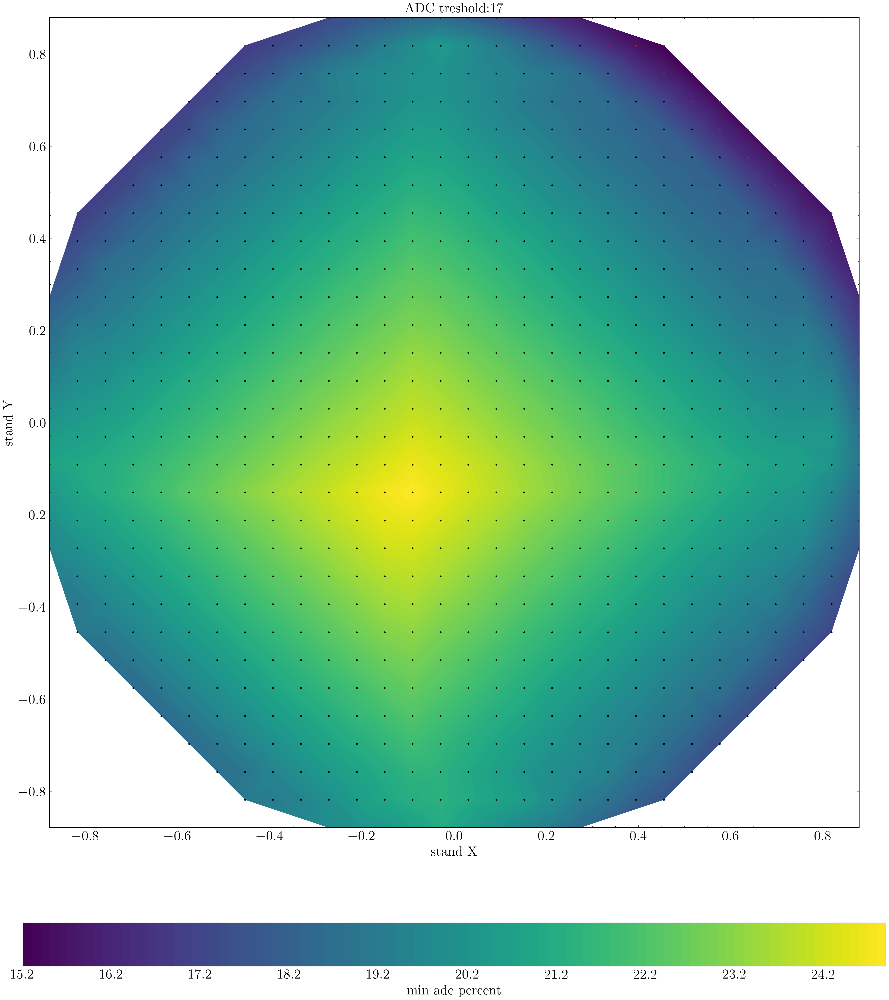

In [8]:
Plotter.plot_intensity_grid(first_run_frame, percent_treshold=17)

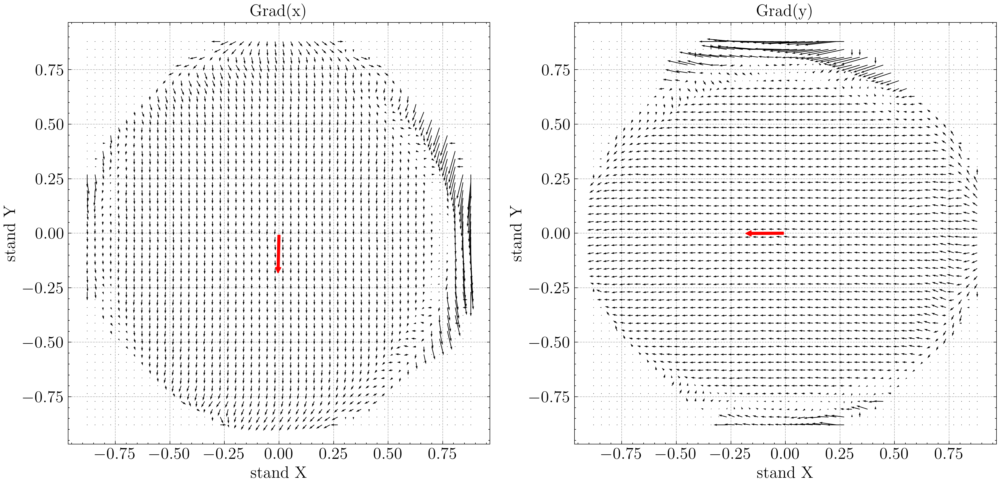

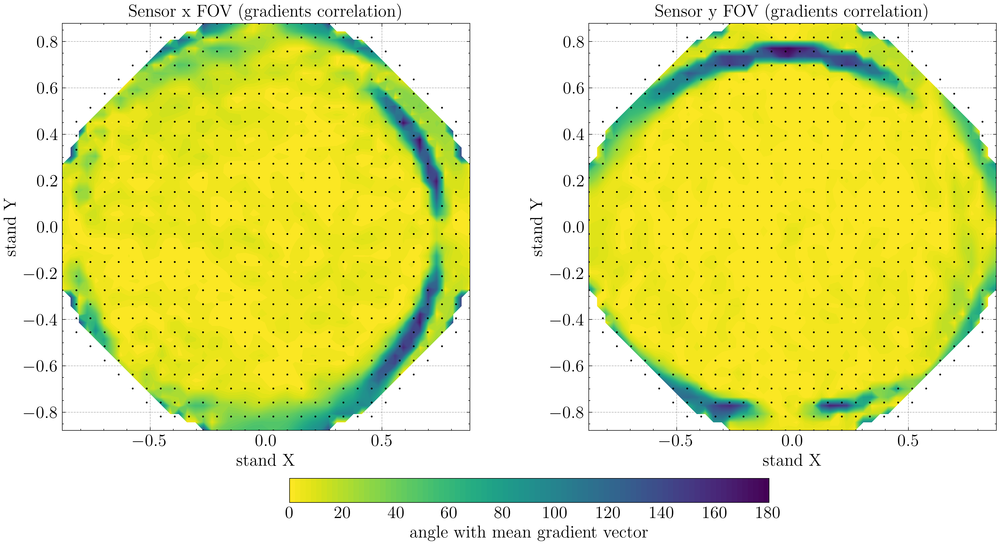

In [9]:
# %%capture
Plotter.plot_light_gradient(first_run_frame)

# Second passage 

## Second passage error assessment 

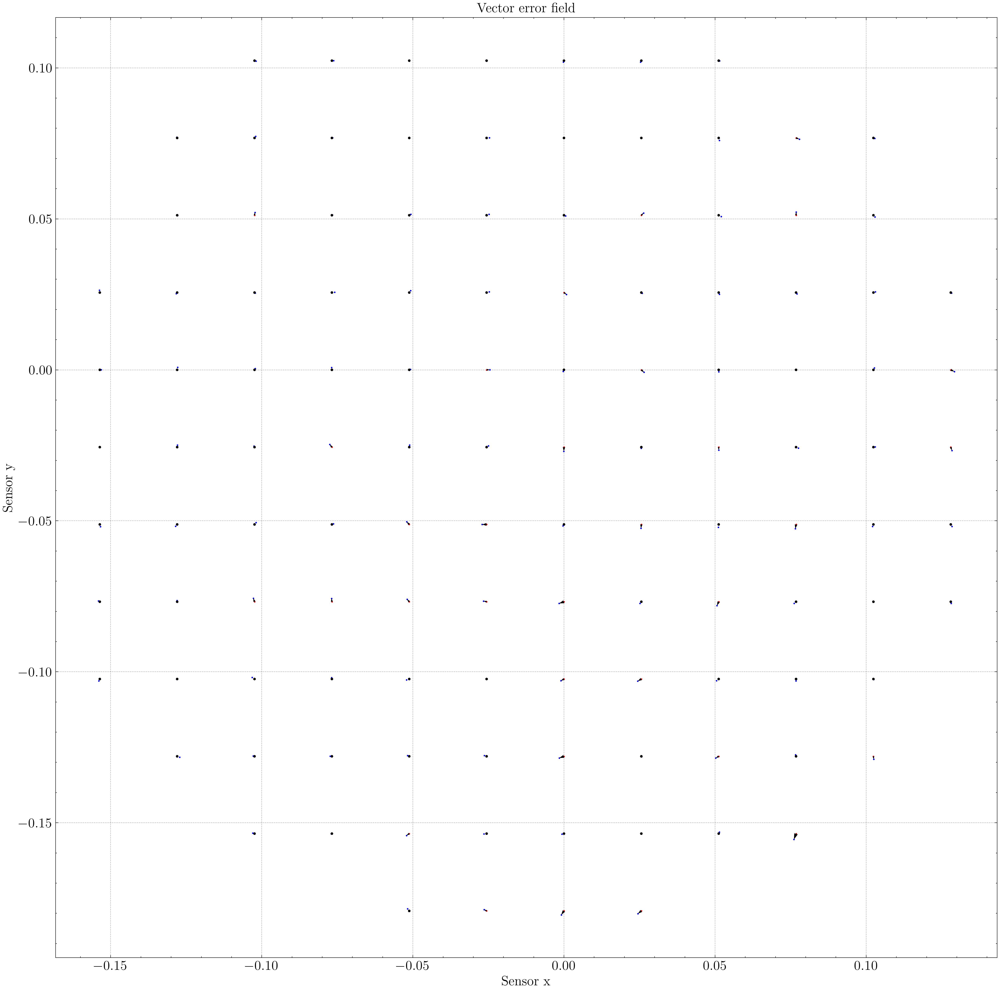

In [10]:
# %%capture
Plotter.plot_first_calibration_vectors(first_log=second_grid_frame, second_log=second_run_frame)

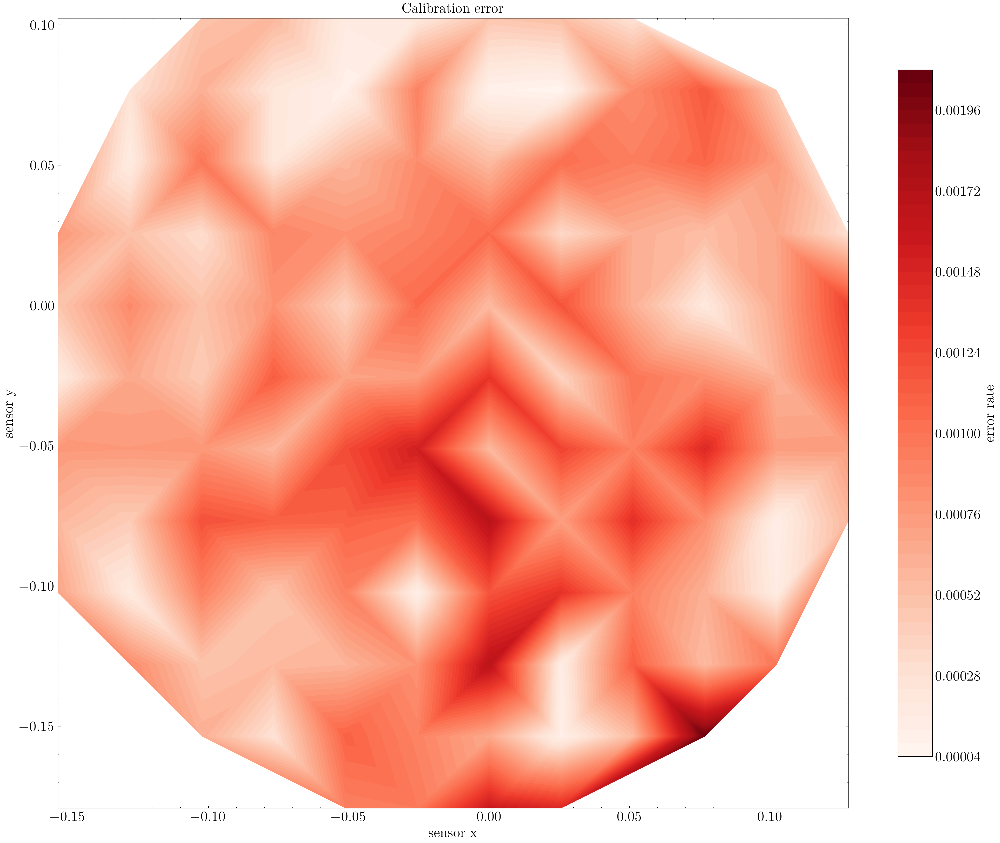

In [11]:
Plotter.plot_first_calibration_error_rate(first_log=second_grid_frame, second_log=second_run_frame)

# Second calibration results with cubic extrapolation

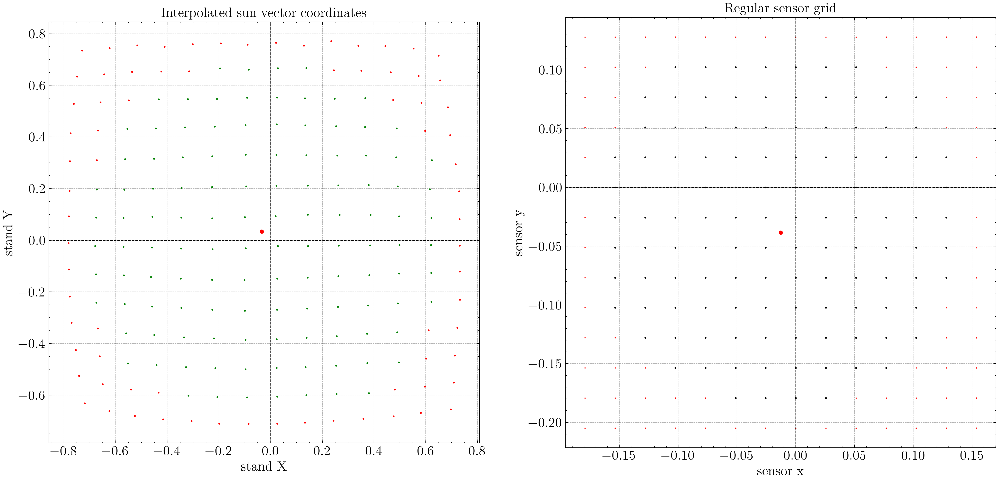

In [12]:
Plotter.plot_interpolation_results(second_calibration_frame)

## Final results

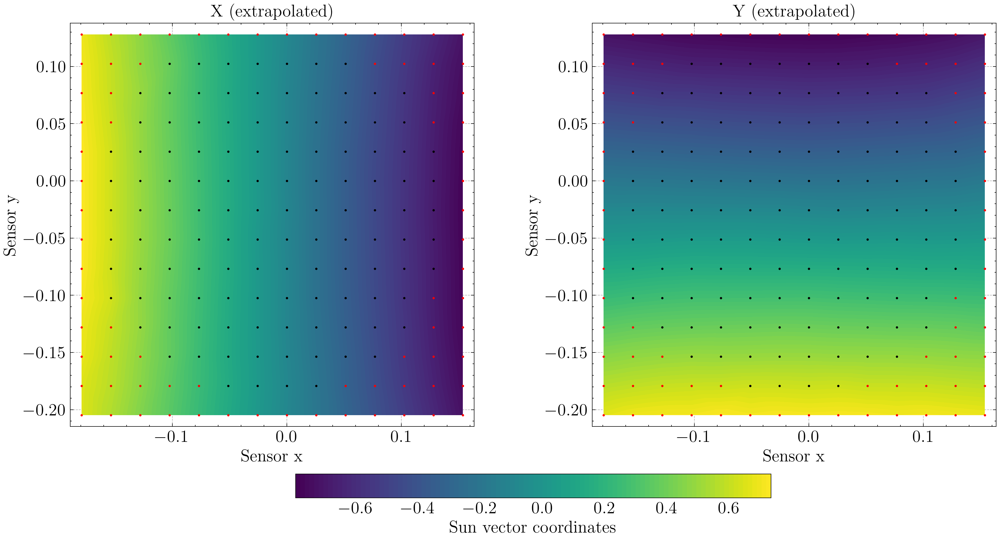

In [13]:
Plotter.plot_extrapolation_results(second_calibration_frame)

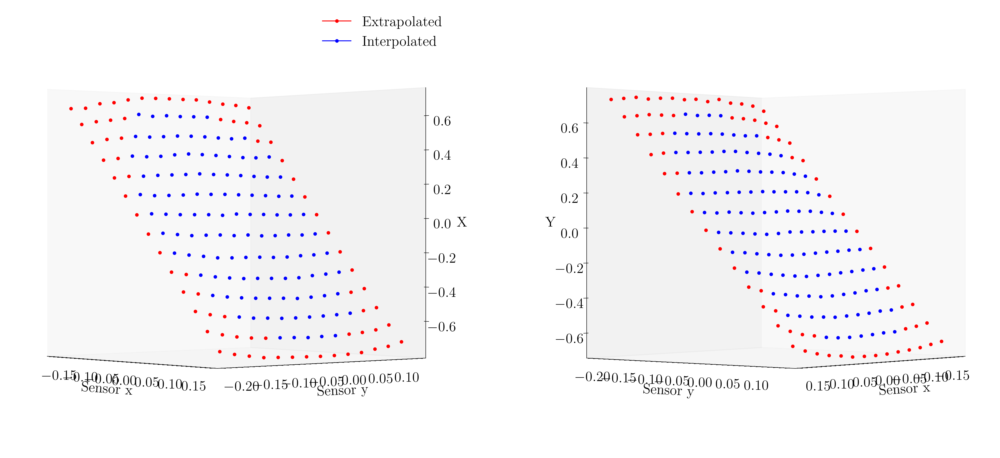

In [14]:
Plotter.plot_3d_interpolation(second_calibration_frame)

# Algorithm error assessment

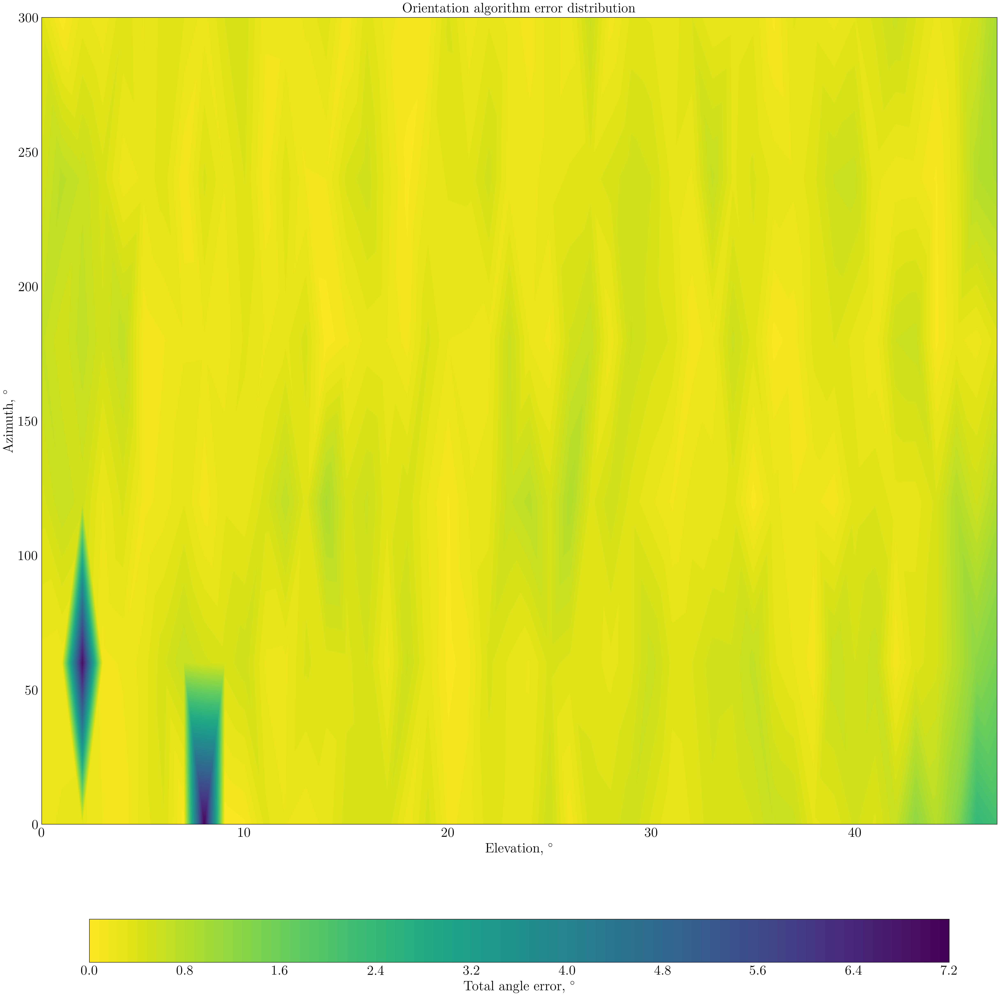

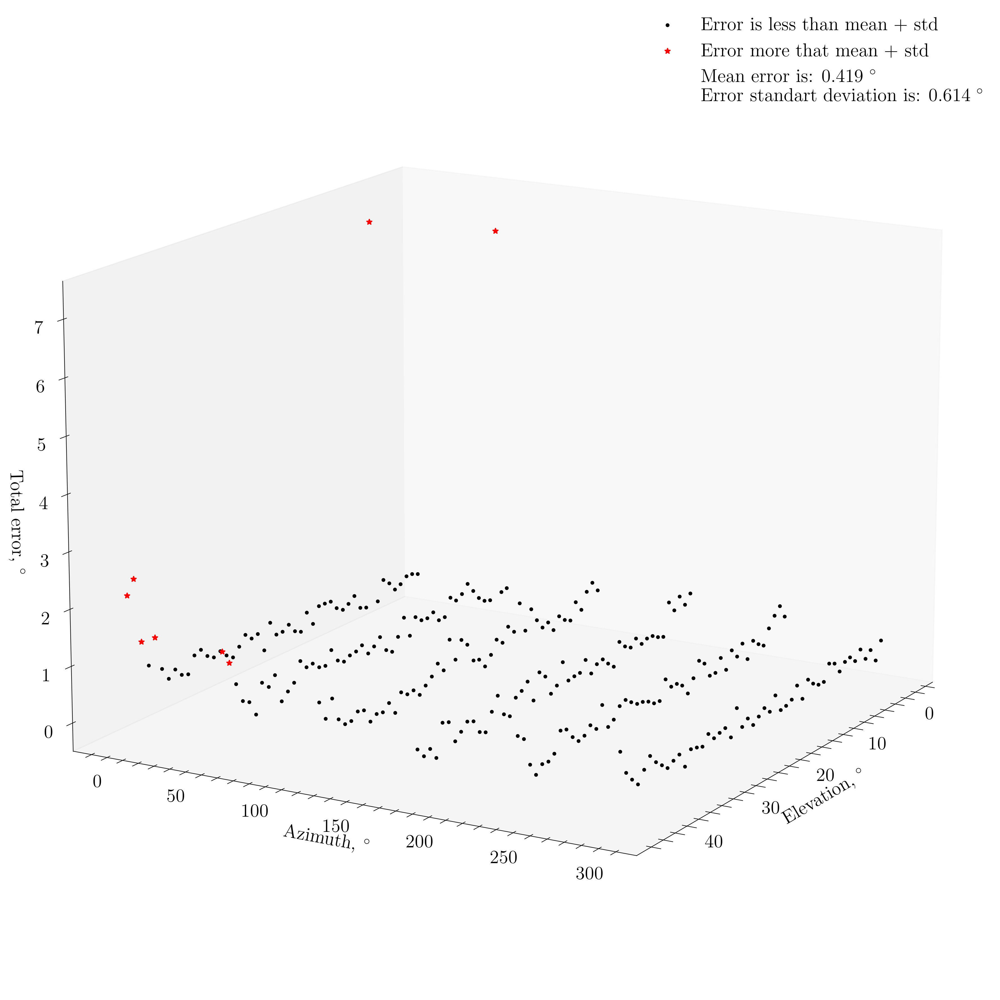

In [15]:
if not error_frame.empty:
    Plotter.plot_error_test_results(error_frame, fov)
    Plotter.plot_3d_error_estimation(error_frame)